# Single Cell RNASeq Data Analysis using Scanpy

In this tutorial, we will:

1) Download public available PBMC dataset from 10X genomics website

2) Loading the gene count matrix (cell ranger output) into AnnData object

3) What:

    - is AnnData object? Different components of AnnData object
    
    - Section 1: Summary of AnnData object
    
    - Section 2: Inspection of newly created AnnData object

4) Section 3: Quality Control on AnnData object

5) Section 4: Filtering cells and genes

6) Section 5: Normalization of data 

7) Section 6: Finding Highly variable genes

8) Section 7: Scaling the data

9) Section 8: Perform PCA analysis

10) Section 9: Finding Neighbors

11) Section 10: Running UMAP and Visualization

In [296]:
#!pip install scanpy
!pip install matplotlib-venn

In [297]:
# Main packages
import scanpy as sc
import pandas as pd


# other packages
import os


#package.module.function()

# Figure parameters
sc.settings.set_figure_params(dpi=80, facecolor="white")
sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.1 scipy==1.9.3 pandas==1.2.4 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.10.3 pynndescent==0.5.8


### Load data

In [298]:
# Peripheral Blood Mononuclear Cells (PBMC) data
# https://scanpy.readthedocs.io/en/stable/api.html#module-scanpy.datasets

adata = sc.datasets.pbmc3k()
adata

AnnData object with n_obs × n_vars = 2700 × 32738
    var: 'gene_ids'

##### File description

10X datasets: https://www.10xgenomics.com/resources/datasets

Explanation about file formats: https://support.10xgenomics.com/single-cell-gene-expression/software/pipelines/latest/output/matrices

'barcodes.tsv' - Cells barcodes (rows)

'genes.tsv' - Genes ID and name (columns)

'matrix.mtx' - Gene Expression matrix (values)

In [299]:
# https://support.10xgenomics.com/single-cell-gene-expression/datasets/1.1.0/pbmc3k?
# https://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz

# Save my Windows folder location into variable using raw string notation which considers as literal characters
filt_folderpath = r"C:/Users/65861/Documents/Work/SingleCell/Python_R_SingleCell/Singlecell/data/filtered_gene_bc_matrices/hg19/"
print(filt_folderpath)

# Check directory contents
print(os.listdir(filt_folderpath))

# Load files into AnnData object
adata = sc.read_10x_mtx(filt_folderpath, var_names = 'gene_symbols',cache=True)

C:/Users/65861/Documents/Work/SingleCell/Python_R_SingleCell/Singlecell/data/filtered_gene_bc_matrices/hg19/
['barcodes.tsv', 'genes.tsv', 'matrix.mtx', 'Screenshot 2023-01-10 212000.png']


### What is AnnData?

AnnData is a Python object used to represent single-cell RNA-seq data in the anndata package. The anndata package is a toolkit for analyzing and working with single-cell RNA-seq data, and is built on top of the popular pandas and numpy libraries.

One of most powerful feature of AnnData object is:  it makes users to easily access and manipulate different types of data from single object.

### Components of AnnData object

`---> X`

The gene expression data is stored as a matrix `(X)`, with rows representing genes and columns representing cells. The data can be either dense (all values are stored in memory) or sparse (only non-zero values are stored in memory).

`---> obs and var`

The AnnData object stores various annotations about the data, such as gene names and IDs, cell barcodes and metadata, and cluster assignments. These annotations are stored in pandas dataframes called `var` (for gene annotations) and `obs` (for cell annotations).

`---> obsm, varm and uns`

The AnnData object can also store the results of various analysis steps, such as dimensionality reduction or clustering. The results such as dictionaries in the form of  unstructured data are stored in the `uns`. Information such as PCA, t-SNE, or UMAP coordinates which are all structured data associated with each cells are stored in `obsm` dataframe. Whereas `varm` dataframes stores additional information in the form of structured data associated with each genes. 

`---> obsp and varp`

`obsp` dataframe contains rows for each cell pair and columns for each structured data element such as distances, similarity score or any other measures that are calculated based on both cells. Whereas the `varp` dataframe contains rows for each gene pair and columns for each structured data element, such as the pairwise similarity or distance between genes, the functional enrichment of gene pairs or any other measures that are calculated based on both genes.

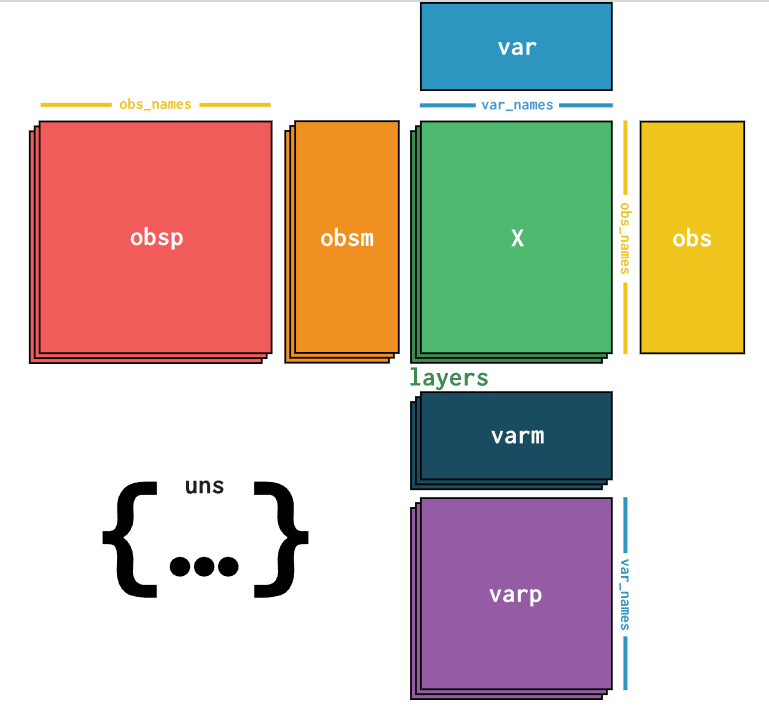

### Section 1: Summary of AnnData object

In [300]:
adata

AnnData object with n_obs × n_vars = 2700 × 32738
    var: 'gene_ids'

In [301]:
print(adata.shape)

(2700, 32738)


In [302]:
print(adata.obs.info())
print('')
print('##########################################')
print('')
print(adata.var.info())

<class 'pandas.core.frame.DataFrame'>
Index: 2700 entries, AAACATACAACCAC-1 to TTTGCATGCCTCAC-1
Empty DataFrameNone

##########################################

<class 'pandas.core.frame.DataFrame'>
Index: 32738 entries, MIR1302-10 to AC002321.1
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   gene_ids  32738 non-null  object
dtypes: object(1)
memory usage: 511.5+ KB
None


### Section 2: Inspection of newly created AnnData object

In [303]:
# List the cell names
adata.obs

""
AAACATACAACCAC-1
AAACATTGAGCTAC-1
AAACATTGATCAGC-1
AAACCGTGCTTCCG-1
AAACCGTGTATGCG-1
...
TTTCGAACTCTCAT-1
TTTCTACTGAGGCA-1
TTTCTACTTCCTCG-1
TTTGCATGAGAGGC-1


In [304]:
# List the cell names
adata.obs.head()

""
AAACATACAACCAC-1
AAACATTGAGCTAC-1
AAACATTGATCAGC-1
AAACCGTGCTTCCG-1
AAACCGTGTATGCG-1


In [305]:
# List the gene names
adata.var

,gene_ids
MIR1302-10,ENSG00000243485
FAM138A,ENSG00000237613
OR4F5,ENSG00000186092
RP11-34P13.7,ENSG00000238009
RP11-34P13.8,ENSG00000239945
...,...
AC145205.1,ENSG00000215635
BAGE5,ENSG00000268590
CU459201.1,ENSG00000251180
AC002321.2,ENSG00000215616


In [306]:
# AnnData stores sparse data in Compressed Sparse Row matrix which are memory efficient instead of large 2-d matrices.
# https://cmdlinetips.com/2018/03/sparse-matrices-in-python-with-scipy/
adata.X

<2700x32738 sparse matrix of type '<class 'numpy.float32'>'
	with 2286884 stored elements in Compressed Sparse Row format>

In [307]:
# Note:
    # Cells by genes in Scanpy
    # Genes by cells in Seurat
    
# create a shallow dataframe (No changes to original dataframe)    
    
adata.to_df()

,MIR1302-10,FAM138A,OR4F5,RP11-34P13.7,RP11-34P13.8,AL627309.1,RP11-34P13.14,RP11-34P13.9,AP006222.2,RP4-669L17.10,...,KIR3DL2-1,AL590523.1,CT476828.1,PNRC2-1,SRSF10-1,AC145205.1,BAGE5,CU459201.1,AC002321.2,AC002321.1
AAACATACAACCAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACATTGAGCTAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACATTGATCAGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCGTGCTTCCG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCGTGTATGCG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCGAACTCTCAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTCTACTGAGGCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTCTACTTCCTCG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGCATGAGAGGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [308]:
# save the raw data before processing values and further filtering
adata.raw = adata

### Section 3: Quality Control on AnnData object

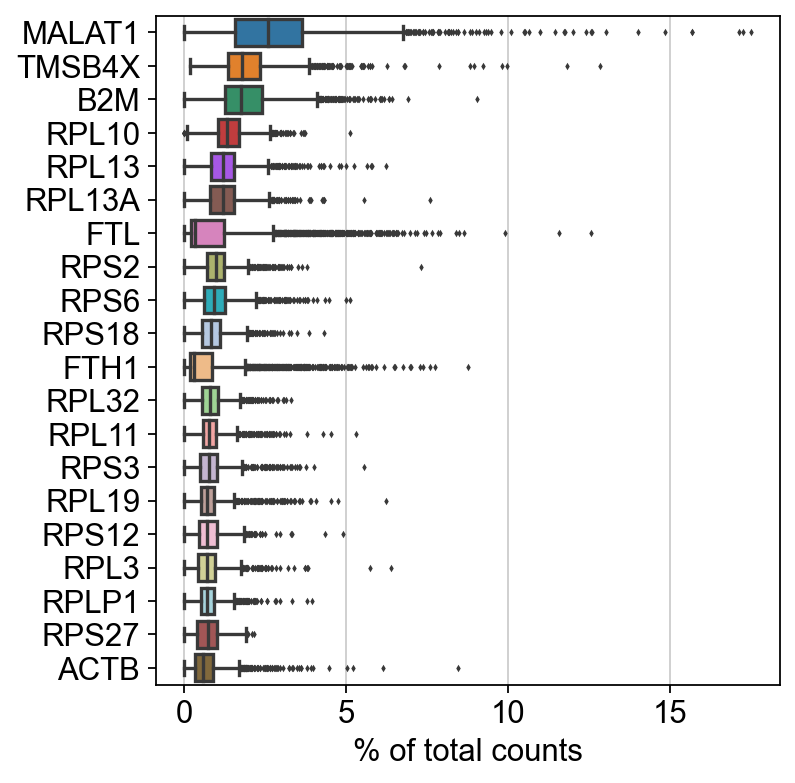

In [309]:
# The n_top genes with the highest mean fraction over all cells 

sc.pl.highest_expr_genes(adata, n_top=20)

#### Section 3a : Populating obs and var dataframes with QC stats

In [310]:
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

In [311]:
# This dataframe now contains: 
#                    1) X matrix with n_obs × n_vars = 2700 × 32738
#                    2) obs: 'n_genes_by_counts', 'total_counts'
#                    3) var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

adata

AnnData object with n_obs × n_vars = 2700 × 32738
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [312]:
# n_genes_by_counts - The number of genes with at least 1 count in a cell
# total_counts - Total number of counts for a cell

adata.obs

,n_genes_by_counts,total_counts
AAACATACAACCAC-1,781,2421.0
AAACATTGAGCTAC-1,1352,4903.0
AAACATTGATCAGC-1,1131,3149.0
AAACCGTGCTTCCG-1,960,2639.0
AAACCGTGTATGCG-1,522,981.0
...,...,...
TTTCGAACTCTCAT-1,1155,3461.0
TTTCTACTGAGGCA-1,1227,3447.0
TTTCTACTTCCTCG-1,622,1684.0
TTTGCATGAGAGGC-1,454,1024.0


In [313]:
adata.var

,gene_ids,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
MIR1302-10,ENSG00000243485,0,0.0,100.0,0.0
FAM138A,ENSG00000237613,0,0.0,100.0,0.0
OR4F5,ENSG00000186092,0,0.0,100.0,0.0
RP11-34P13.7,ENSG00000238009,0,0.0,100.0,0.0
RP11-34P13.8,ENSG00000239945,0,0.0,100.0,0.0
...,...,...,...,...,...
AC145205.1,ENSG00000215635,0,0.0,100.0,0.0
BAGE5,ENSG00000268590,0,0.0,100.0,0.0
CU459201.1,ENSG00000251180,0,0.0,100.0,0.0
AC002321.2,ENSG00000215616,0,0.0,100.0,0.0


#### Section 3b : Populating obs/var dataframes columns manually

In [314]:
adata.var_names

Index(['MIR1302-10', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8',
       'AL627309.1', 'RP11-34P13.14', 'RP11-34P13.9', 'AP006222.2',
       'RP4-669L17.10',
       ...
       'KIR3DL2-1', 'AL590523.1', 'CT476828.1', 'PNRC2-1', 'SRSF10-1',
       'AC145205.1', 'BAGE5', 'CU459201.1', 'AC002321.2', 'AC002321.1'],
      dtype='object', length=32738)

In [315]:
adata.var_names.str.startswith('MT-')

array([False, False, False, ..., False, False, False])

In [316]:
# annotate mitochondrial genes as 'mt' and calculate qc metrics
adata.var['mt'] = adata.var_names.str.startswith('MT-') # creates a new column in var dataframe with boolean values for gene names that start with MT
adata

AnnData object with n_obs × n_vars = 2700 × 32738
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'

In [317]:
# print mt column
adata.var['mt']

MIR1302-10      False
FAM138A         False
OR4F5           False
RP11-34P13.7    False
RP11-34P13.8    False
                ...  
AC145205.1      False
BAGE5           False
CU459201.1      False
AC002321.2      False
AC002321.1      False
Name: mt, Length: 32738, dtype: bool

In [318]:
# print var dataframe columns
adata.var

,gene_ids,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,mt
MIR1302-10,ENSG00000243485,0,0.0,100.0,0.0,False
FAM138A,ENSG00000237613,0,0.0,100.0,0.0,False
OR4F5,ENSG00000186092,0,0.0,100.0,0.0,False
RP11-34P13.7,ENSG00000238009,0,0.0,100.0,0.0,False
RP11-34P13.8,ENSG00000239945,0,0.0,100.0,0.0,False
...,...,...,...,...,...,...
AC145205.1,ENSG00000215635,0,0.0,100.0,0.0,False
BAGE5,ENSG00000268590,0,0.0,100.0,0.0,False
CU459201.1,ENSG00000251180,0,0.0,100.0,0.0,False
AC002321.2,ENSG00000215616,0,0.0,100.0,0.0,False


In [319]:
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True) #,

In [320]:
adata

AnnData object with n_obs × n_vars = 2700 × 32738
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'

In [321]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True) #,

In [322]:
adata

AnnData object with n_obs × n_vars = 2700 × 32738
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'

Violin plot below explains the quality measures:

* n_genes_by_counts - The number of genes with at least 1 count in a cell
* total_counts - Total number of counts for a cell
* pct_counts_mt - percentage of counts in mitochondrial genes

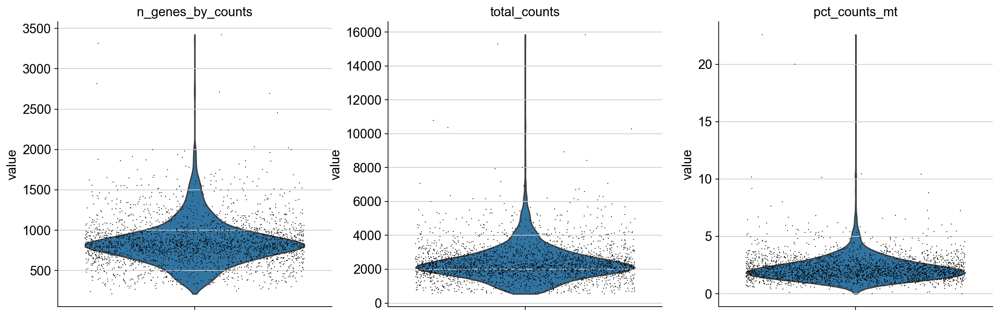

In [323]:
# plot a violin plot with some QC metrics
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)

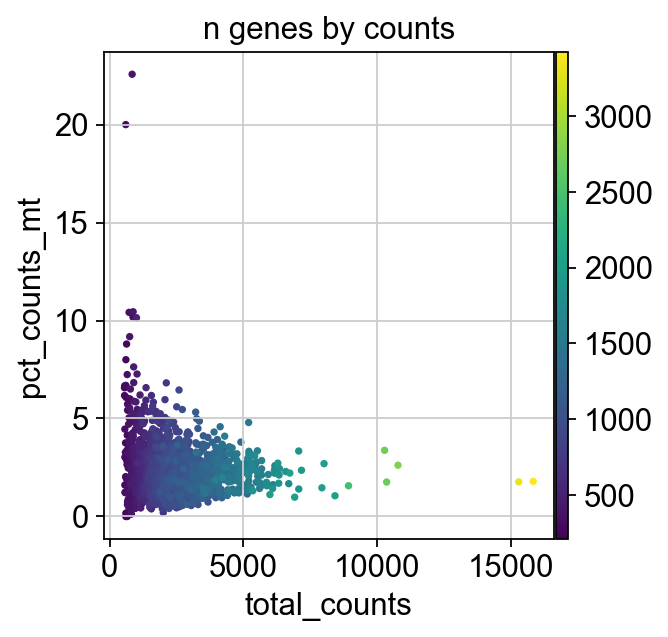

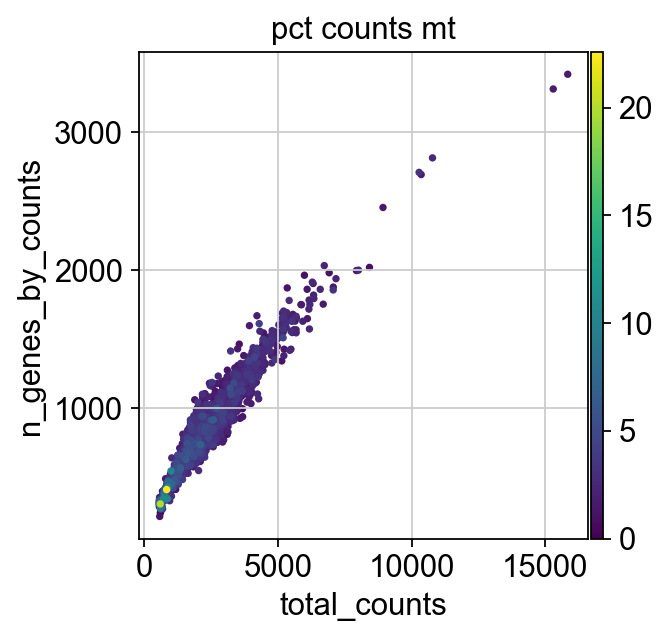

In [324]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color='n_genes_by_counts')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt')

* We can see here that some of the cells have more than 5% of mitochrondrial genes and very low total_counts. These probably might be dead/dying cells.

* Also we can see that some of the cells have very high total_counts 

As a whole, we will be filtering:

* cells with < 200 genes and higher mt genes (>5%)
* cells with optimal mt genes (<5%) but with higher genes expressed (doublets)
* genes that are expressed in less than “X” cells

### Section 4: Filtering cells and genes

#### Section 4a: Filtering cells with < 200 genes and higher mt genes (>5%)

In [325]:
sc.pp.filter_cells(adata, min_genes=200)
print(adata)
adata = adata[adata.obs.pct_counts_mt < 5, :]
print(adata)

AnnData object with n_obs × n_vars = 2700 × 32738
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'
View of AnnData object with n_obs × n_vars = 2643 × 32738
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'


#### Section 4b: Possible doublet cells

In [326]:
print(adata)
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
print(adata)

View of AnnData object with n_obs × n_vars = 2643 × 32738
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'
View of AnnData object with n_obs × n_vars = 2638 × 32738
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'


#### Section 4c: Genes that are expressed in less than “X” cells

In [327]:
print(adata)
sc.pp.filter_genes(adata, min_cells=3)
print(adata)

View of AnnData object with n_obs × n_vars = 2638 × 32738
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'
AnnData object with n_obs × n_vars = 2638 × 13656
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells'


C:\Users\65861\anaconda3\lib\site-packages\scanpy\preprocessing\_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


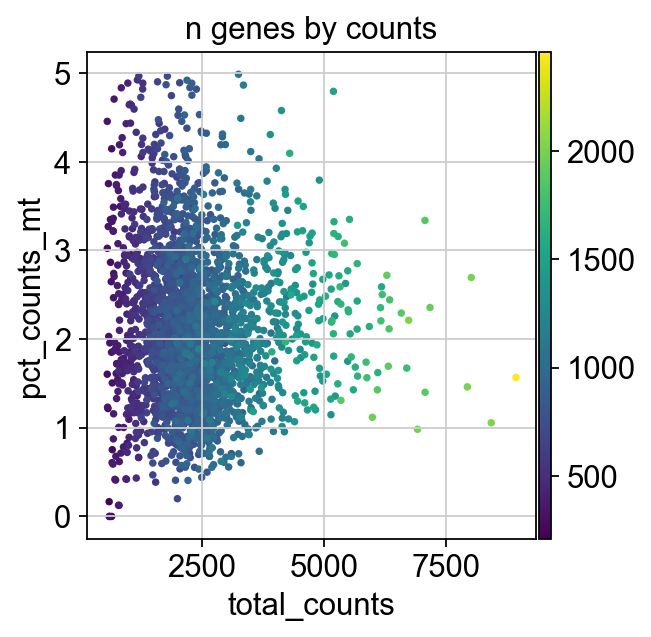

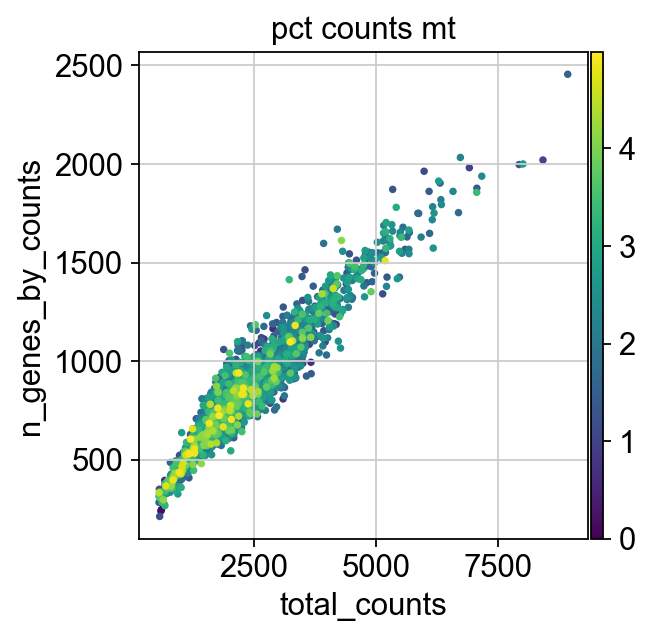

In [328]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color='n_genes_by_counts')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt')

Post QC we can now see in the plot: 
* cells with less than 5% mt gene expression
* n_genes_by_counts <= 2500 genes
* total_counts <= ~ 8000 genes

### Section 5: Normalization and Log transformation

Normalisation is done to adjust the sampling effects or technical biases in the data.

Capture efficiency (efficiency with which a particular assay or method to detect the RNA in cell), sequencing depth (amount of RNA that is sequenced in an experiment), and other technical confounders (such as quality of the samples or the performance of the instrument) can all introduce bias and variation in gene expression data.

We will now normalize the counts in the data matrix X to 10,000 reads per cell

In [329]:
sc.pp.normalize_total(adata, target_sum=1e4)
adata

AnnData object with n_obs × n_vars = 2638 × 13656
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells'

Log-transforming the data can help to reduce this skewness and make the data more symmetric, making it easier to visualize and analyze. Now, we will change normalised counts to log counts

In [330]:
#log n+1 transform
sc.pp.log1p(adata)

In [331]:
adata

AnnData object with n_obs × n_vars = 2638 × 13656
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells'
    uns: 'log1p'

### Section 6: Finding Highly variable genes

Highly variable genes are subset of genes that exhibit high cell-to-cell variation in expression levels

These genes may be highly influential in shaping the phenotype of an organism, and they are often of interest to researchers because of their potential role in disease or other biological processes.

### HVG vs DEG

As highly variable genes are characterized by expression across the cells, differentially expressed genes are characterized by their significant changes in expression levels between different conditions or treatments.

In [332]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [333]:
print(adata)

AnnData object with n_obs × n_vars = 2638 × 13656
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'


In [334]:
adata.var['highly_variable']

AL627309.1       False
AP006222.2       False
RP11-206L10.2    False
RP11-206L10.9    False
LINC00115        False
                 ...  
AC145212.1       False
AL592183.1       False
AL354822.1       False
PNRC2-1          False
SRSF10-1         False
Name: highly_variable, Length: 13656, dtype: bool

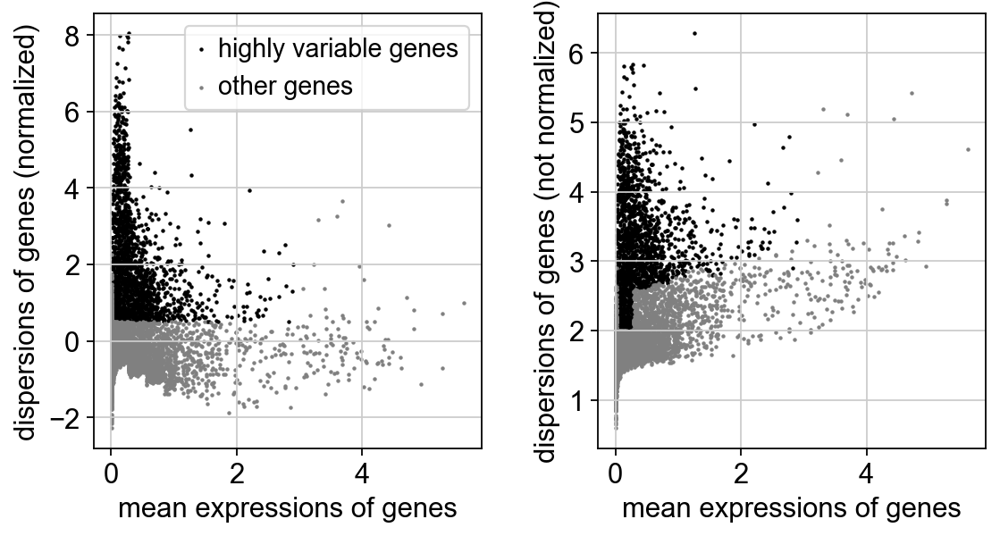

In [335]:
sc.pl.highly_variable_genes(adata)

In [336]:
# now we will filter out the highly variable genes
adata = adata[:, adata.var.highly_variable]
adata

View of AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

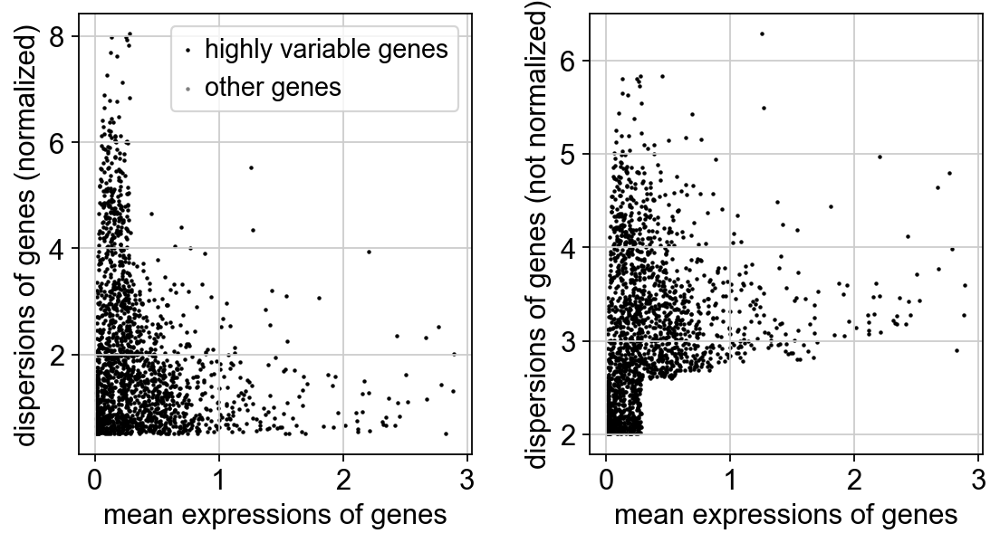

In [337]:
sc.pl.highly_variable_genes(adata)

### Section 7: Scaling the data

In [338]:
# scale to unit variance for PCA, clip values exceeding standard deviation 10
sc.pp.scale(adata, max_value=10)

C:\Users\65861\anaconda3\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [339]:
print(adata)


AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'


### Section 8: Dimensionality reduction with PCA

* Very useful tool for dimensionality reduction
* Fast and efficient
* Helps in deciding number of PCs to use for clustering analysis downstream

In [340]:
sc.tl.pca(adata)

In [341]:
print(adata)

AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'


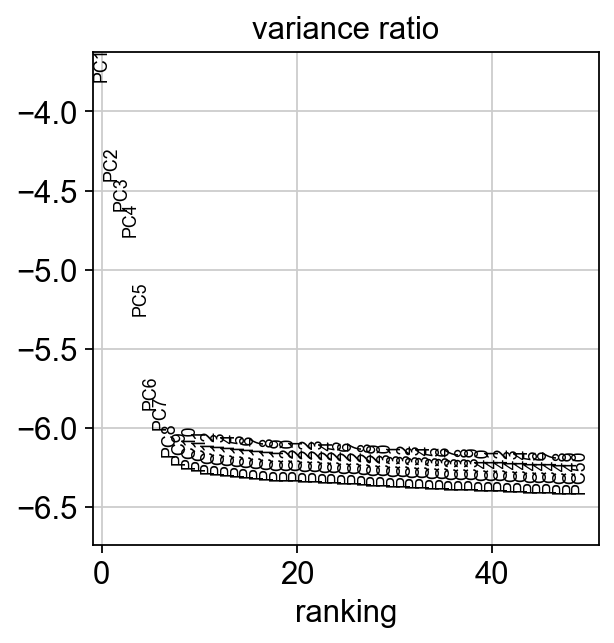

In [342]:
# We will now plot 50 PCs that are contributing to the variance and choose the number of PCs 
# Basically, when the curve starts to flatten that may be roughly be the number of PCs we could choose
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

The below plot gives us information which genes are contributing to the Principal components

C:\Users\65861\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Glyph 8942 (\N{VERTICAL ELLIPSIS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


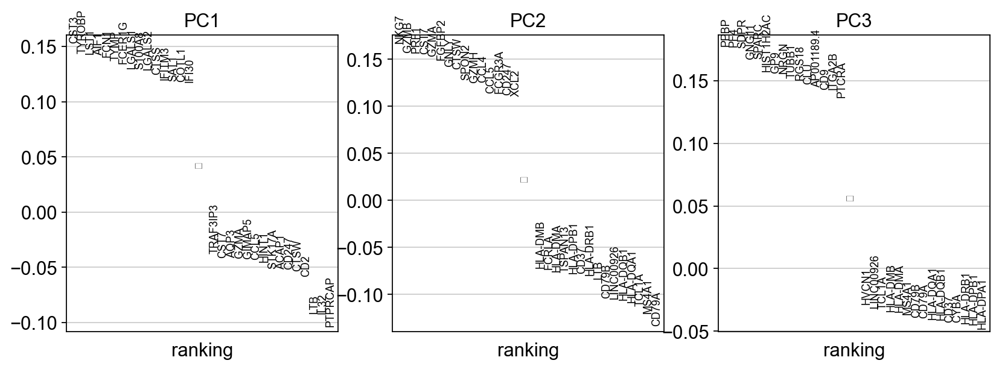

In [343]:
sc.pl.pca_loadings(adata) 

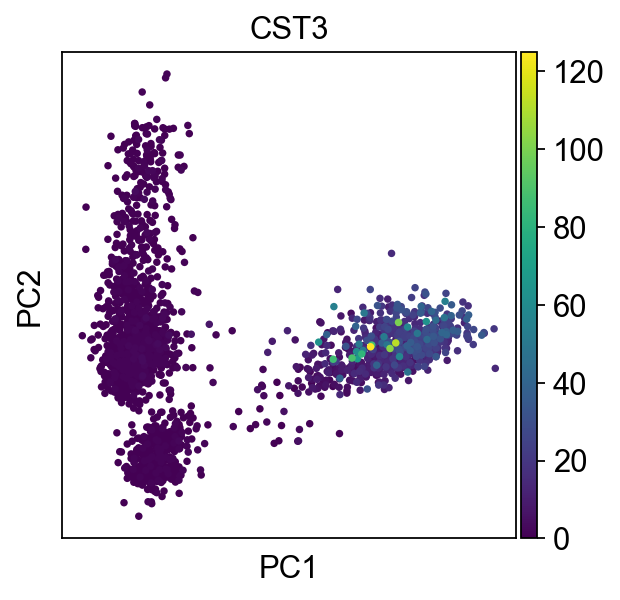

In [344]:
sc.pl.pca(adata, color='CST3')

### Section 9: Finding Neighbors by computing the neighborhood graph

In [345]:
sc.pp.neighbors(adata, n_pcs=15)

In [346]:
adata

AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [347]:
adata.obsp

PairwiseArrays with keys: distances, connectivities

In [348]:
# obsp attribute contains two keys: 'distances' and 'connectivities', each key has a value that is a sparse matrix.

for key, value in adata.obsp.items():
    print("key: ", key)
    print("value: ", value)

key:  distances
value:    (0, 136)	4.820805549621582
  (0, 305)	4.436575889587402
  (0, 474)	4.195146560668945
  (0, 518)	3.862053632736206
  (0, 618)	4.948511123657227
  (0, 671)	4.900221347808838
  (0, 703)	4.733293056488037
  (0, 963)	4.39759635925293
  (0, 1240)	4.9944658279418945
  (0, 1345)	4.794695854187012
  (0, 1769)	4.374881267547607
  (0, 1980)	4.535458087921143
  (0, 2148)	4.844375133514404
  (0, 2165)	4.844648361206055
  (1, 10)	5.912111759185791
  (1, 107)	6.156311988830566
  (1, 165)	4.280860900878906
  (1, 351)	5.943164348602295
  (1, 561)	6.010931968688965
  (1, 930)	5.750222682952881
  (1, 999)	5.733217239379883
  (1, 1049)	6.3153605461120605
  (1, 1054)	5.832777500152588
  (1, 1203)	6.469470977783203
  (1, 1638)	6.19853401184082
  :	:
  (2636, 683)	4.698379993438721
  (2636, 854)	4.852623462677002
  (2636, 1413)	4.587987422943115
  (2636, 1422)	4.894596099853516
  (2636, 1574)	5.0807013511657715
  (2636, 2173)	4.644686222076416
  (2636, 2200)	4.956090450286865
  (263

### Section 10: Embedding the neighborhood graph by running UMAP

* Some cells may have very similar patterns of gene despite not being the same type of cell. 
* UMAP and t-SNE could be used to identify the cells that have similar patterns of gene expression and group them together. 
* UMAP is better at preserving the global neighborhood structure of the data compared to t-SNE.
* Thus, PCA which uses a linear model cannot capture patterns based on gene expression.

In [349]:
sc.tl.umap(adata)

In [350]:
adata

AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [351]:
print(adata.obsm['X_pca'])

[[-4.289821    0.45749444 -0.14602043 ...  1.3855213  -1.1967028
   2.7602124 ]
 [-0.47377744 -5.3312864  -2.374846   ... -0.16745923  3.4247932
  -1.5011965 ]
 [-2.031224    2.3861907   0.5954452  ...  2.0175674   1.4611629
  -2.2560327 ]
 ...
 [-2.5570986  -7.470679   -1.9865679  ... -1.1256918  -1.1001749
   0.7034667 ]
 [-2.909362   -6.743694   -1.3093078  ... -0.435194   -2.0363493
   1.5172887 ]
 [-2.4489858  -0.9688855   0.35677132 ... -0.6134295  -0.7325067
  -1.0352086 ]]


In [352]:
print(adata.obsm['X_umap'])

[[10.841306    8.5493555 ]
 [ 5.064553    1.179617  ]
 [13.381575   10.330438  ]
 ...
 [ 7.2902784   2.0086472 ]
 [ 7.468056    0.75403655]
 [11.501497    7.785371  ]]


### Section 11: Visualization

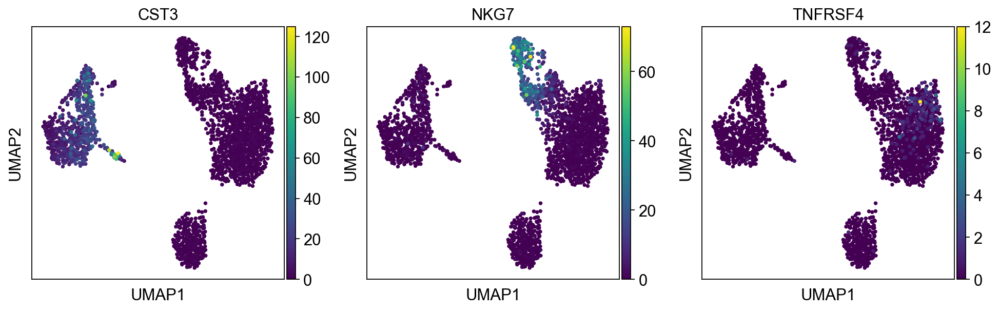

In [353]:
# the below command will use the data stored in the 'X_umap' by default. 
sc.pl.umap(adata,color=['CST3', 'NKG7', 'TNFRSF4'])

# Part 2 - Downstream analysis

The next steps would be to perform other downstream analysis such as:

* Clustering using graph based clustering methods such as Leiden algorithm.
* Gene expression analysis such as identifying differentially expressed genes, identifying marker genes for each cluster
* Cluster annotation (Cell type annotation)

### Section 12: Clustering the cells from the neighborhood graph

Why to cluster the cells?

**Identifying cell types:** Clustering can be used to identify different cell types present in the sample, which is important for understanding the cellular makeup of a tissue or organism.

**Characterizing cell populations:** Clustering can be used to identify distinct subpopulations of cells within a cell type, which can provide insights into the diversity and complexity of the cell population.

**Understanding cell states:** Clustering can be used to identify different states of a cell, such as cells that are actively dividing or cells that are in a quiescent state.

**Identifying markers and pathways:** Clustering can be used to identify marker genes and pathways that are specific to a particular cell type or population, which can provide insights into the biology of the cells and can help to identify new therapeutic targets.

**Trajectory inference:** Clustering can be used as a first step in trajectory inference, which is a method to infer the developmental or temporal relationships between different cell types by analyzing the patterns of gene expression across different time points or conditions.


From the above umap plot, we see only three clusters of cells. Based on prior knowledge of marker genes, we know that there  atleast 6-8 cell types can be identified from these three clusters. 

We assume we do not have prior knowledge and hence cluster cells using clustering algorithms available in scanpy.

In [355]:
#!pip3 install leidenalg

import numpy as np
import matplotlib.pyplot as plt


In [356]:
print(adata)
sc.tl.leiden(adata)
print(adata)

AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'
AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


### Cluster resolution 

A parameter value controlling the coarseness of the clustering. Higher values lead to more clusters. 

`sc.tl.leiden(annData, resolution=resolution)`

### What is the optimal resolution value that I should for clustering?

The optimal resolution value for clustering will depend on the specific dataset and the research question being addressed.

For example, PBMC datasets are known to have a high cellular heterogeneity, so a low resolution value may be a good starting point to identify broad cell types, such as T cells, B cells, and monocytes.

To identify subtypes within specific cell types, such as T helper cell subtypes or B cell subsets, then a higher resolution may be necessary.

Overall, does increasing or decreasing the resolution distinguish the cells that are interest of the researcher.

In [357]:
# Create a list to store the number of clusters for each resolution
cluster_counts = []

# Set the range of resolution parameters to test
#resolutions = [0.1, 0.2, 0.3, 0.4, 0.5]
resolutions = np.arange(0.1, 2, 0.1)

# Loop through the range of resolution parameters
#for resolution in resolutions:
for resolution in np.arange(0.1, 2, 0.1):    
    # Run the Leiden algorithm
    sc.tl.leiden(adata, resolution=resolution)
    # Get the number of clusters
    n_clusters = len(adata.obs['leiden'].unique())
    # Append the number of clusters to the list
    cluster_counts.append(n_clusters)
    


In [358]:
cluster_counts

[4, 5, 6, 6, 8, 9, 9, 9, 10, 11, 12, 13, 14, 15, 15, 15, 17, 17, 18]

In [264]:
adata

AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [265]:
#print(plt.style.available)

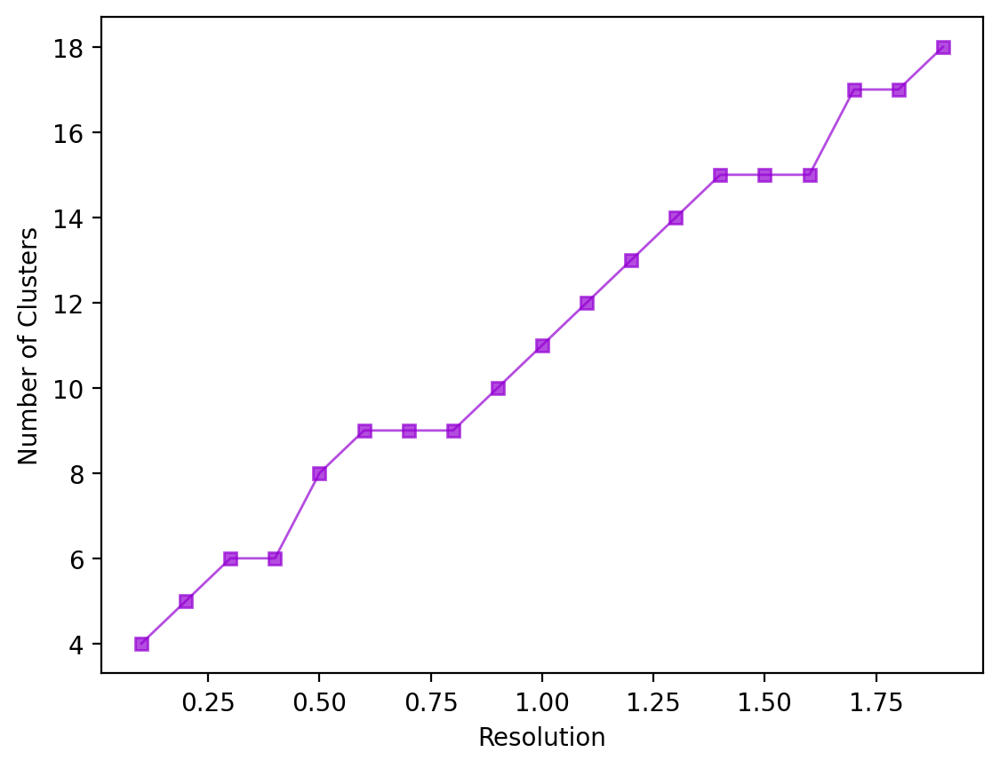

In [359]:
# Plot the relationship between resolution and number of clusters

plt.style.use('default')
plt.plot(resolutions, cluster_counts,marker='s',alpha=.7, markersize=5, color='darkviolet', linewidth=1)
plt.xlabel('Resolution')
plt.ylabel('Number of Clusters')
plt.show()

In [267]:
#sc.pl.umap(clHVG_data, color=['leiden']) # default resolution in 1.0

In [268]:
adata

AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [360]:
# Lets draw the plot for multiple resolutions
sc.tl.leiden(adata, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata, resolution = 1.4, key_added = "leiden_1.4")

C:\Users\65861\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


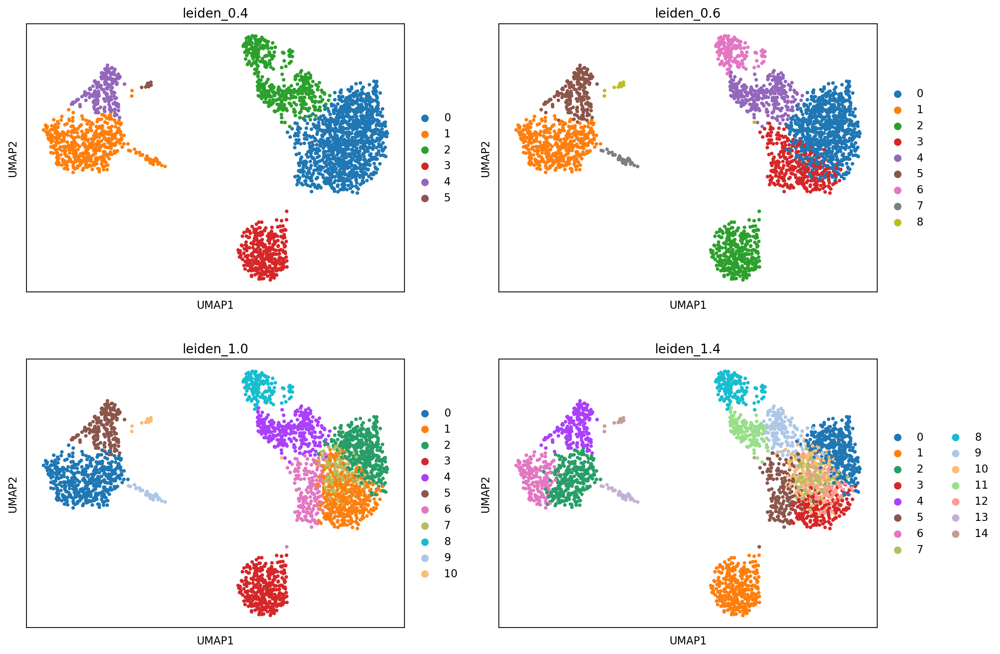

In [361]:
sc.pl.umap(adata, color=['leiden_0.4', 'leiden_0.6', 'leiden_1.0','leiden_1.4'], ncols=2)

In [362]:
adata

AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [364]:
for i in np.arange(0.1, 2, 0.1):
    print(i)
    sc.tl.leiden(adata, resolution=i, key_added = "leiden_"+str(i))   
    #sc.pl.umap(clHVG_data, color=['leiden'])

0.1
0.2
0.30000000000000004
0.4
0.5
0.6
0.7000000000000001
0.8
0.9
1.0
1.1
1.2000000000000002
1.3000000000000003
1.4000000000000001
1.5000000000000002
1.6
1.7000000000000002
1.8000000000000003
1.9000000000000001


In [365]:
adata

AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'leiden_0.1', 'leiden_0.2', 'leiden_0.30000000000000004', 'leiden_0.5', 'leiden_0.7000000000000001', 'leiden_0.8', 'leiden_0.9', 'leiden_1.1', 'leiden_1.2000000000000002', 'leiden_1.3000000000000003', 'leiden_1.4000000000000001', 'leiden_1.5000000000000002', 'leiden_1.6', 'leiden_1.7000000000000002', 'leiden_1.8000000000000003', 'leiden_1.9000000000000001'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [366]:
filter_col = [col for col in adata.obs if col.startswith('leiden')]
filter_col

['leiden',
 'leiden_1.0',
 'leiden_0.6',
 'leiden_0.4',
 'leiden_1.4',
 'leiden_0.1',
 'leiden_0.2',
 'leiden_0.30000000000000004',
 'leiden_0.5',
 'leiden_0.7000000000000001',
 'leiden_0.8',
 'leiden_0.9',
 'leiden_1.1',
 'leiden_1.2000000000000002',
 'leiden_1.3000000000000003',
 'leiden_1.4000000000000001',
 'leiden_1.5000000000000002',
 'leiden_1.6',
 'leiden_1.7000000000000002',
 'leiden_1.8000000000000003',
 'leiden_1.9000000000000001']

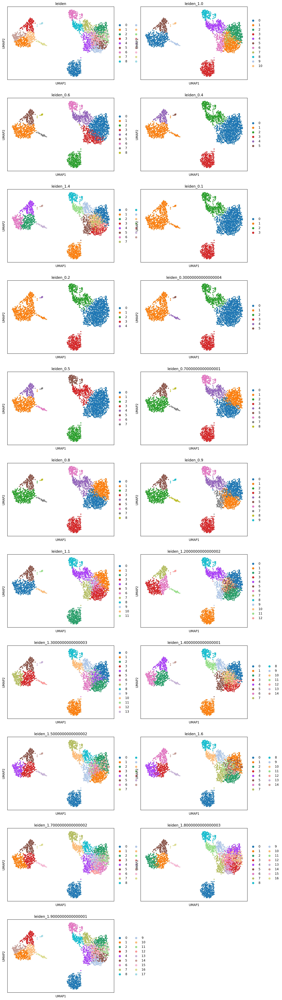

In [367]:
sc.pl.umap(adata, color=filter_col, ncols=2)

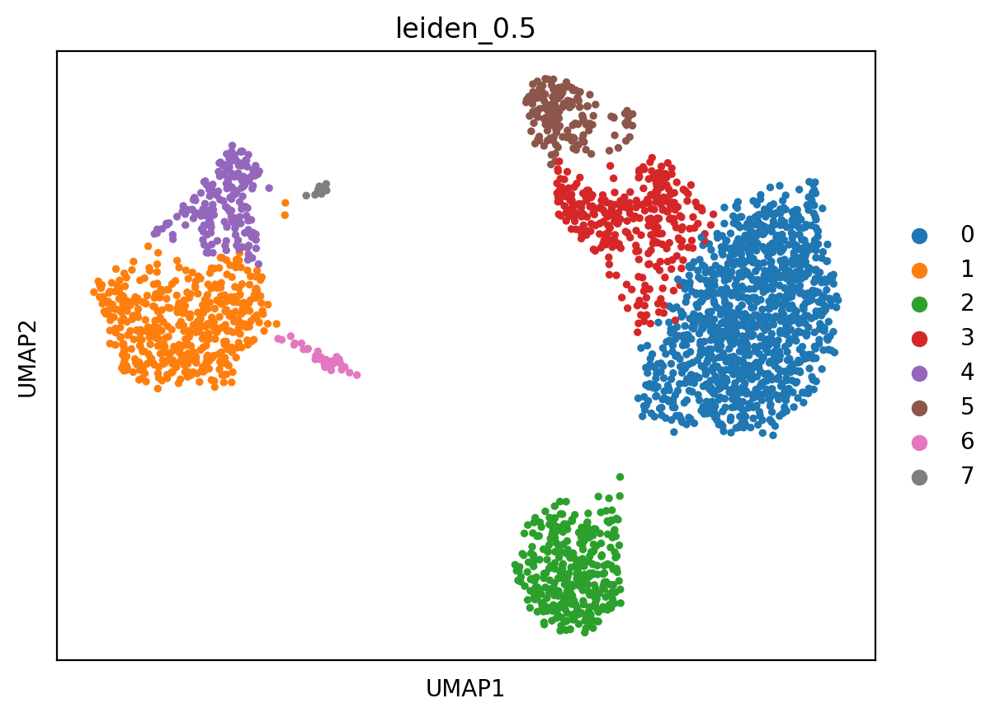

In [368]:
sc.pl.umap(adata, color=['leiden_0.5'])

C:\Users\65861\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
C:\Users\65861\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(


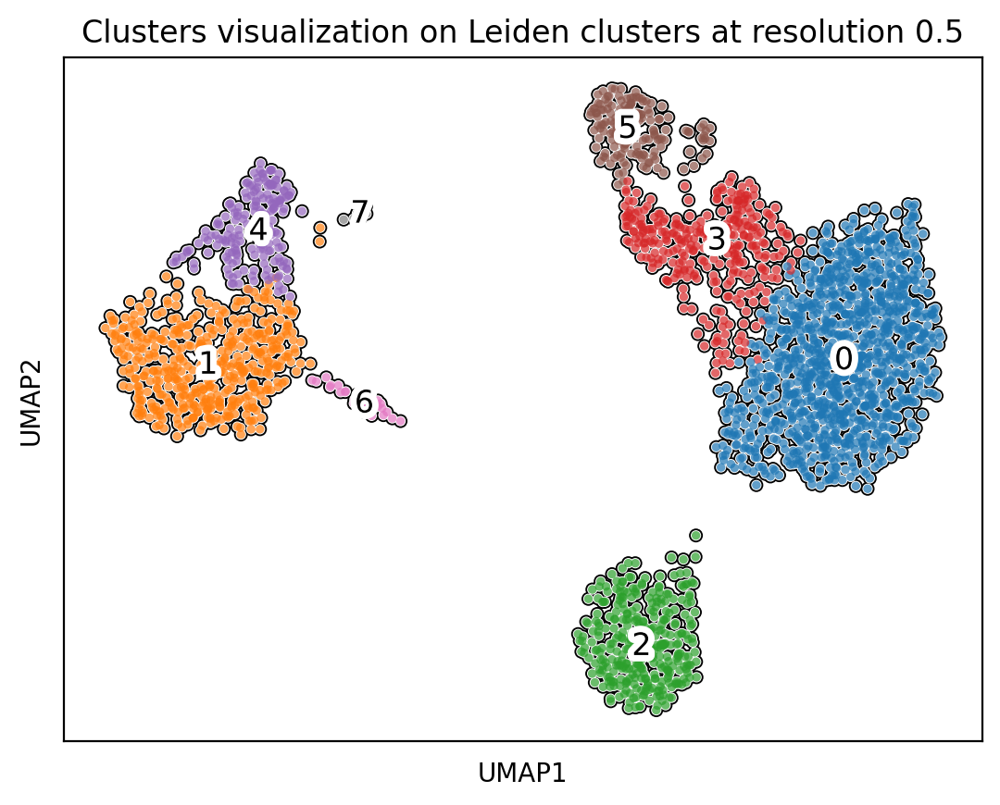

In [369]:
#plot the UMAP
sc.pl.umap(adata, color=['leiden_0.5'], add_outline=True, 
           title='Clusters visualization on Leiden clusters at resolution 0.5',
           legend_loc='on data', #'right margin',
           legend_fontoutline=5, legend_fontweight= 'normal',
           legend_fontsize= 12, outline_width =(0.2, 0.1), frameon=True, save = '_leiden.png')

In [370]:
### Composition of the clusters

# How many cells are in each cluster

# Useful to decide what resolution value

print(adata.obs['leiden_0.5'].value_counts())

0    1139
1     457
2     344
3     309
4     183
5     158
6      35
7      13
Name: leiden_0.5, dtype: int64


### Section 13: Finding Marker genes

https://genomebiology.biomedcentral.com/articles/10.1186/s13059-017-1382-0

**Specifically, SCANPY provides preprocessing comparable to SEURAT** [10] and CELL RANGER [6], visualization through TSNE [11, 12], graph-drawing [13–15] and diffusion maps [11, 16, 17], clustering similar to PHENOGRAPH [18–20], **identification of marker genes for clusters via differential expression tests​**

Here, we will annotate the clusters by identifying marker genes between the clusters.

The function uses the t-test/wilcoxon rank-sum test to compare the mean/median expression of each gene within a cluster of interest to the mean/median expression of the same gene in all other clusters. It then ranks the genes based on their differential expression, with the genes that are most highly expressed in the cluster of interest appearing at the top of the list.

* Higher score -> higher expression, lower p-value (more evidence the levels of expression between groups are different)
* Lower score -> lower expression, higher p-value

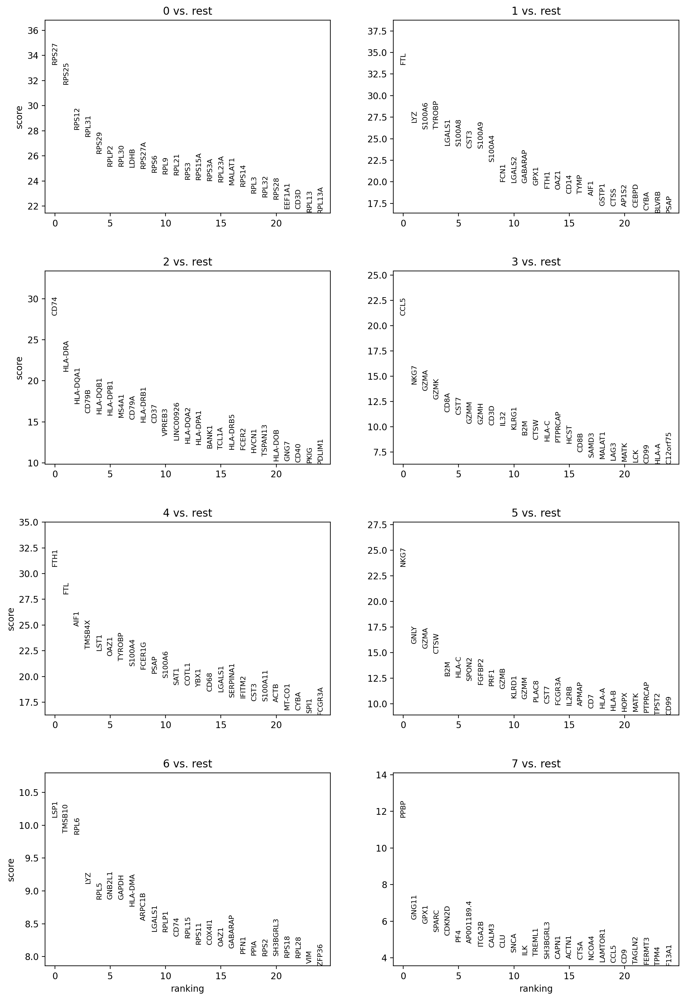

In [371]:
#using t-test
sc.tl.rank_genes_groups(adata, 'leiden_0.5', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "t-test", ncols=2)

The t-test is a parametric test that assumes that the data is normally distributed. It compares the means of two groups and calculates a p-value to determine the probability that the observed difference in means is due to chance. The t-test is sensitive to outliers and can be affected by the presence of non-normal data.

The Wilcoxon rank-sum test is a non-parametric test that does not assume a normal distribution of the data. It compares the medians of two groups and calculates a p-value to determine the probability that the observed difference in medians is due to chance. This test is less sensitive to outliers and can be more robust to non-normal data.

In the case of single cell data, it is common to have non-normal data due to the high variability in the expression levels and zero-inflation. So, Wilcoxon test may be more appropriate.

In [372]:
adata

AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'leiden_0.1', 'leiden_0.2', 'leiden_0.30000000000000004', 'leiden_0.5', 'leiden_0.7000000000000001', 'leiden_0.8', 'leiden_0.9', 'leiden_1.1', 'leiden_1.2000000000000002', 'leiden_1.3000000000000003', 'leiden_1.4000000000000001', 'leiden_1.5000000000000002', 'leiden_1.6', 'leiden_1.7000000000000002', 'leiden_1.8000000000000003', 'leiden_1.9000000000000001'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors', 'leiden_colors', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.30000000000000004_colors'

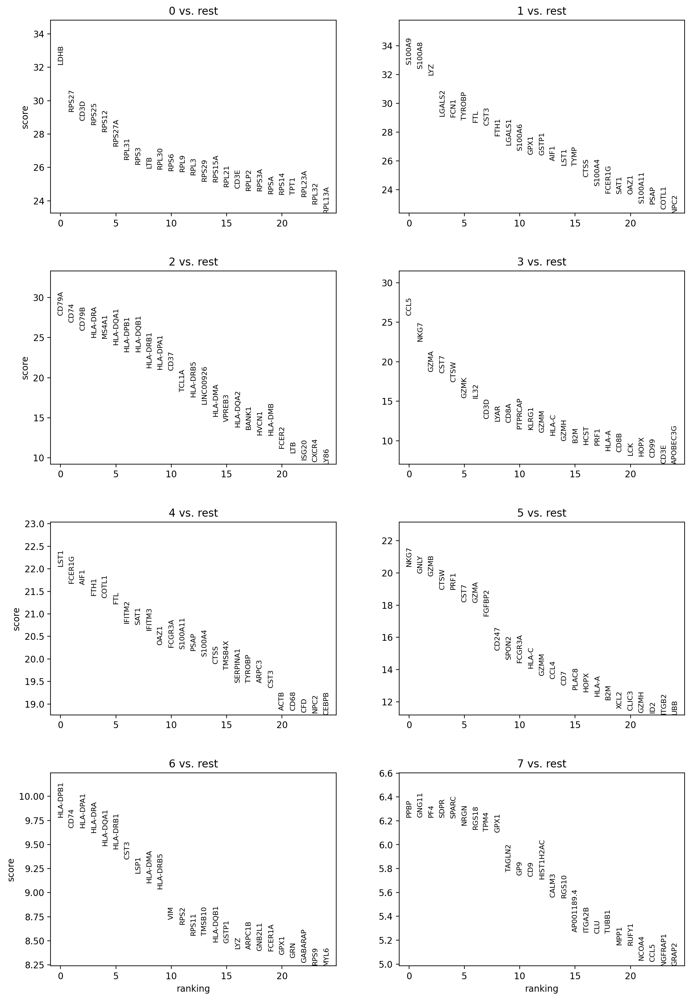

In [373]:
#using wilcoxon rank-sum test
sc.tl.rank_genes_groups(adata, 'leiden_0.5', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "wilcoxon", ncols=2)

In [374]:
print(adata)
len(adata.uns['wilcoxon']['names']['0']) 

AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'leiden_0.1', 'leiden_0.2', 'leiden_0.30000000000000004', 'leiden_0.5', 'leiden_0.7000000000000001', 'leiden_0.8', 'leiden_0.9', 'leiden_1.1', 'leiden_1.2000000000000002', 'leiden_1.3000000000000003', 'leiden_1.4000000000000001', 'leiden_1.5000000000000002', 'leiden_1.6', 'leiden_1.7000000000000002', 'leiden_1.8000000000000003', 'leiden_1.9000000000000001'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors', 'leiden_colors', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.30000000000000004_colors'

32738

In [375]:
# Genes are sorted based on the score for each cluster
# columns names are cluster num
# For example, LTB gene is found to posess highest score in "cluster_0"
pd.DataFrame(adata.uns['wilcoxon']['names']).head(5)

,0,1,2,3,4,5,6,7
0,LDHB,S100A9,CD79A,CCL5,LST1,NKG7,HLA-DPB1,PPBP
1,RPS27,S100A8,CD74,NKG7,FCER1G,GNLY,CD74,GNG11
2,CD3D,LYZ,CD79B,GZMA,AIF1,GZMB,HLA-DPA1,PF4
3,RPS25,LGALS2,HLA-DRA,CST7,FTH1,CTSW,HLA-DRA,SDPR
4,RPS12,FCN1,MS4A1,CTSW,COTL1,PRF1,HLA-DQA1,SPARC


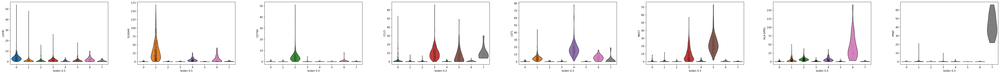

In [193]:
# visualising the expression levels of marker genes within the cluster of cells also helps with annotation.
sc.pl.violin(adata, ['LDHB', 'S100A9', 'CD79A','CCL5','LST1','NKG7','HLA-DPB1','PPBP'], groupby='leiden_0.5', ncols=2)

In [284]:
#adata.var
#sc.pl.dotplot(adata, var_names=highly_variable, groupby='louvain_r0.2')
#adata.uns['wilcoxon']['names']


rec.array([('LDHB', 'S100A9', 'CD79A', 'CCL5', 'LST1', 'NKG7', 'HLA-DPB1', 'PPBP'),
           ('RPS27', 'S100A8', 'CD74', 'NKG7', 'FCER1G', 'GNLY', 'CD74', 'GNG11'),
           ('CD3D', 'LYZ', 'CD79B', 'GZMA', 'AIF1', 'GZMB', 'HLA-DPA1', 'PF4'),
           ...,
           ('HLA-DRA', 'PTPRCAP', 'S100A6', 'RPS11', 'IL32', 'RPL13', 'PTPRCAP', 'RPL3'),
           ('HLA-DRB1', 'RPS27A', 'TMSB4X', 'FTH1', 'CD3D', 'RPL18A', 'LTB', 'RPL21'),
           ('CD74', 'MALAT1', 'S100A4', 'TMSB10', 'PTPRCAP', 'RPL32', 'CD3D', 'RPL10')],
          dtype=[('0', 'O'), ('1', 'O'), ('2', 'O'), ('3', 'O'), ('4', 'O'), ('5', 'O'), ('6', 'O'), ('7', 'O')])

In [376]:
# save differentially expressed genes (DEGs)  between clusters which are ranked by score
result = adata.uns['wilcoxon']
groups = result['names'].dtype.names
df1 = pd.DataFrame({group+'' + key:result[key][group] for group in groups for key in ['names','scores','logfoldchanges','pvals','pvals_adj']})
df1.head()
#df1.to_csv("scanpy_pbmc_3k_DEGs_between_clusters.csv")

,0names,0scores,0logfoldchanges,0pvals,0pvals_adj,1names,1scores,1logfoldchanges,1pvals,1pvals_adj,...,6names,6scores,6logfoldchanges,6pvals,6pvals_adj,7names,7scores,7logfoldchanges,7pvals,7pvals_adj
0,LDHB,32.159031,4.457010,6.604588e-227,2.162210e-222,S100A9,32.687515,46.403194,2.349939e-234,7.693230e-230,...,HLA-DPB1,9.780827,58.479279,1.360939e-22,4.378553e-18,PPBP,6.228411,65.638054,4.711897e-10,0.000003
1,RPS27,29.340878,15.516373,3.123997e-189,5.113671e-185,S100A8,32.399982,26.221460,2.746396e-230,4.495576e-226,...,CD74,9.672027,119.462791,3.964465e-22,4.378553e-18,GNG11,6.228046,21.910515,4.722886e-10,0.000003
2,CD3D,28.800837,3.760208,2.093853e-182,2.284952e-178,LYZ,31.941832,62.921463,7.015093e-224,7.655337e-220,...,HLA-DPA1,9.670798,44.340668,4.012358e-22,4.378553e-18,PF4,6.228046,33.598000,4.722886e-10,0.000003
3,RPS25,28.557329,8.324882,2.277983e-179,1.864415e-175,LGALS2,29.097059,8.511021,3.911015e-186,3.200970e-182,...,HLA-DRA,9.622654,95.532516,6.415425e-22,5.250705e-18,SDPR,6.226403,22.191298,4.772646e-10,0.000003
4,RPS12,28.125301,16.744843,4.805699e-174,1.966612e-170,FCN1,29.037249,9.347914,2.229484e-185,1.459777e-181,...,HLA-DQA1,9.484922,19.282013,2.425635e-21,1.588209e-17,SPARC,6.220198,11.827059,4.965288e-10,0.000003


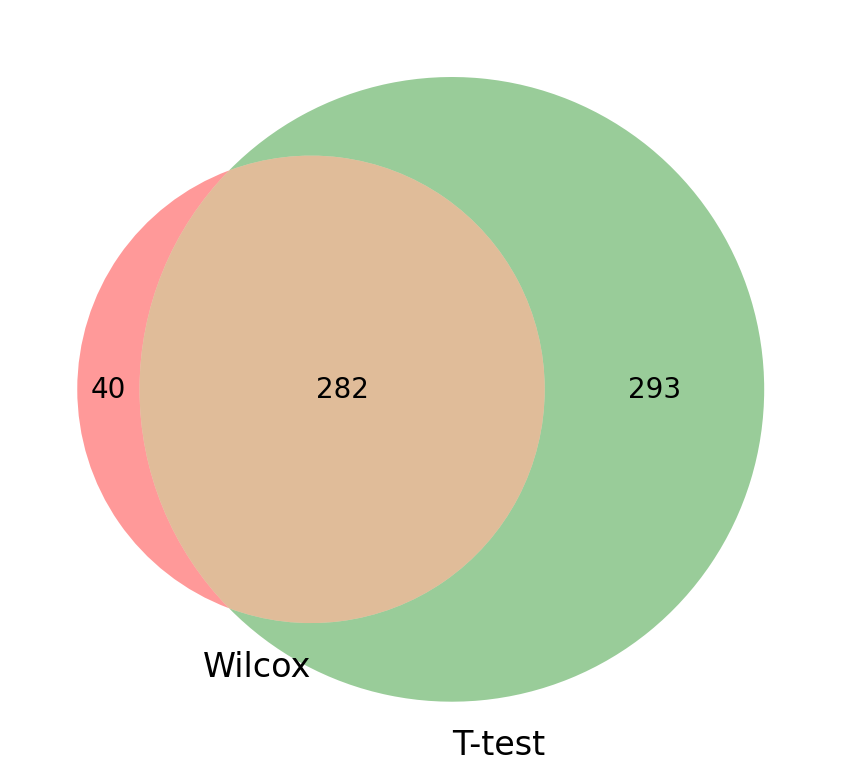

In [377]:
#adata
wc = sc.get.rank_genes_groups_df(adata, group='0', key='wilcoxon', pval_cutoff=0.01, log2fc_min=0)['names']
tt = sc.get.rank_genes_groups_df(adata, group='0', key='t-test', pval_cutoff=0.01, log2fc_min=0)['names']

from matplotlib_venn import venn2

venn2([set(wc),set(tt)], ('Wilcox','T-test') )
plt.show()

As we understand Wilcoxon rank-sum test is less sensitive than the t-test, which means that it will require larger differences in expression levels to identify DEGs. This is why the Wilcoxon rank-sum test may have produced fewer DEGs than the t-test.

### Section 14: Visualization of Top Differntially Expressed Genes

We will now visualize the expression of the top 5 differentially expressed genes per cluster obtained from the Wilcoxon rank-sum test using various plots such as heatmap, dotplot, violin plot or matrix.

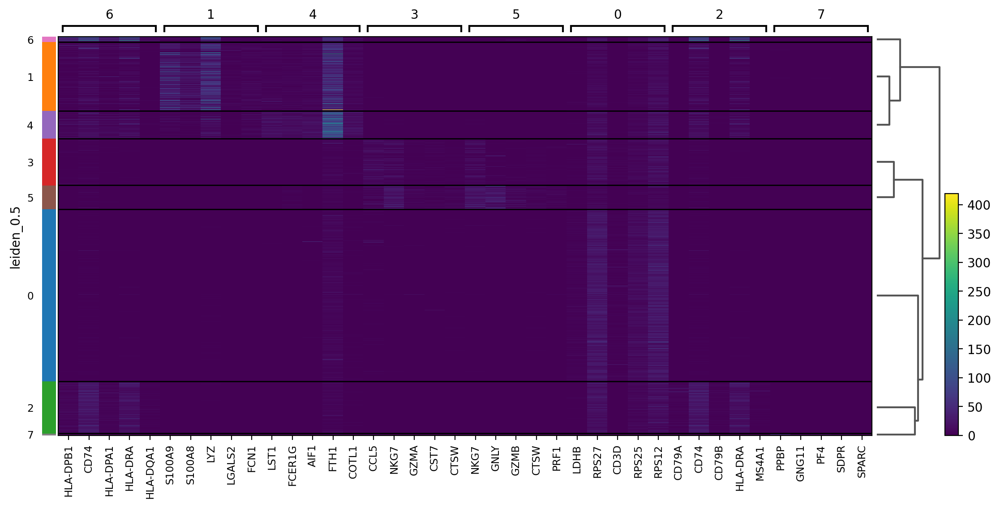

In [378]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, key="wilcoxon", groupby="leiden_0.5", show_gene_labels=True)

C:\Users\65861\anaconda3\lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


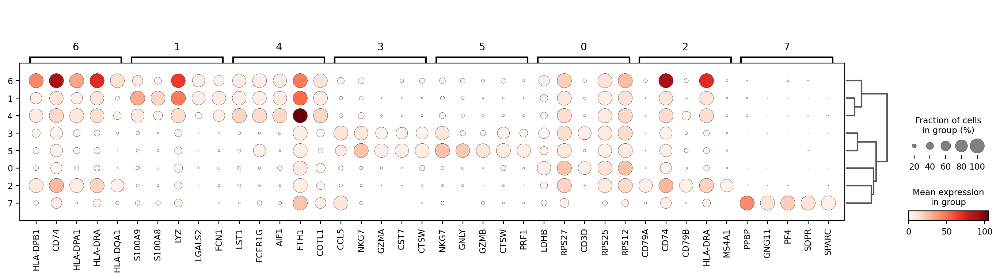

In [379]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, key="wilcoxon", groupby="leiden_0.5")

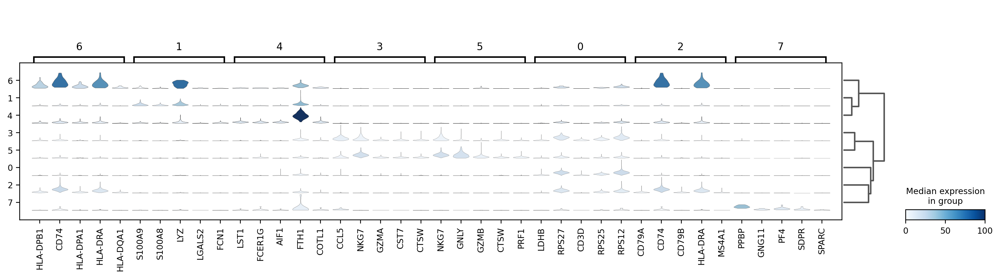

In [289]:
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=5, key="wilcoxon", groupby="leiden_0.5")

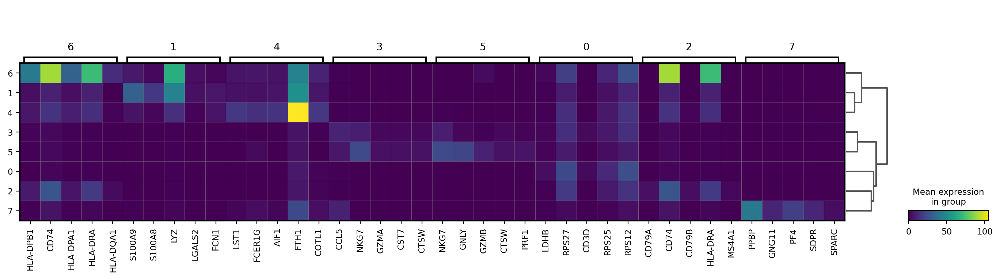

In [380]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="wilcoxon", groupby="leiden_0.5")

One way to annotate clusters is to use the results of the `sc.tl.rank_genes_groups` function and the `sc.pl.rank_genes_groups_ {heatmap/dotplot/stacked_violin/matrixplot}` function to identify genes that are highly expressed in specific clusters and then use this information to assign labels to the clusters.

### Section 15: Cluster Annotation

In [381]:
marker_genes = ['IL7R', 'CD79A', 'MS4A1', 'CD8A', 'CD8B', 'LYZ', 'CD14',
                'LGALS3', 'S100A8', 'GNLY', 'NKG7', 'KLRB1',
                'FCGR3A', 'MS4A7', 'FCER1A', 'CST3', 'PPBP']

In [382]:
print(adata)
new_cluster_names = [
    'CD4 T', 'CD14 Monocytes',
    'B', 'CD8 T',
    'NK', 'FCGR3A Monocytes',
    'Dendritic', 'Megakaryocytes']
#new_cluster_names
adata.rename_categories('leiden_0.5', new_cluster_names)
#print(adata)

AnnData object with n_obs × n_vars = 2638 × 1826
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'leiden_0.1', 'leiden_0.2', 'leiden_0.30000000000000004', 'leiden_0.5', 'leiden_0.7000000000000001', 'leiden_0.8', 'leiden_0.9', 'leiden_1.1', 'leiden_1.2000000000000002', 'leiden_1.3000000000000003', 'leiden_1.4000000000000001', 'leiden_1.5000000000000002', 'leiden_1.6', 'leiden_1.7000000000000002', 'leiden_1.8000000000000003', 'leiden_1.9000000000000001'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors', 'leiden_colors', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.30000000000000004_colors'

C:\Users\65861\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


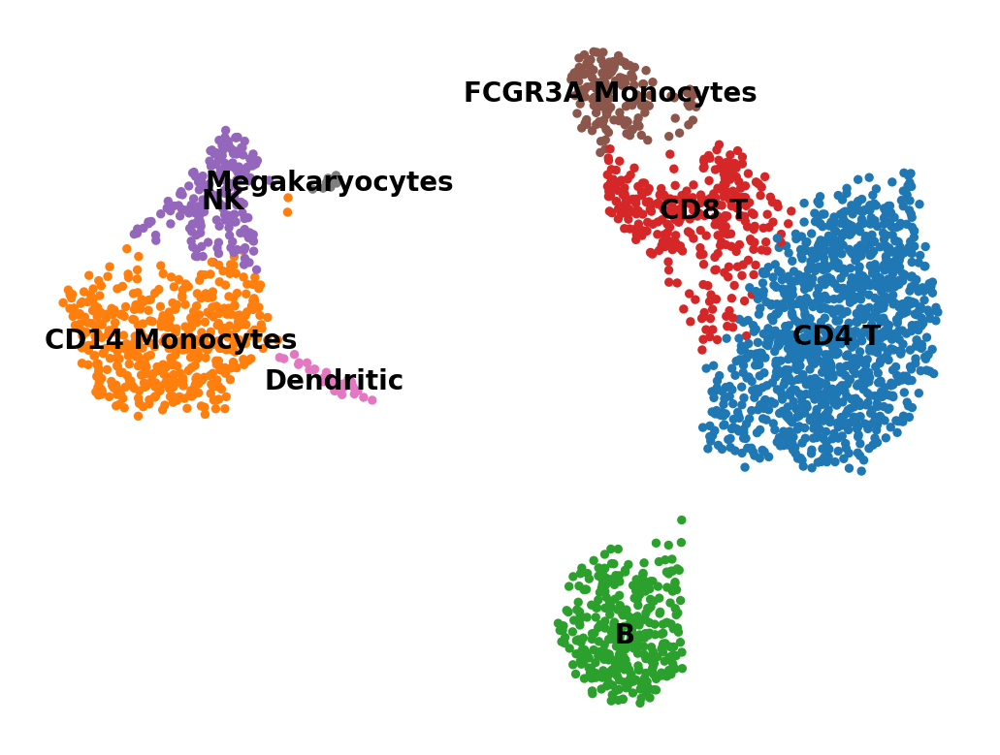

In [383]:
sc.pl.umap(adata, color='leiden_0.5', legend_loc='on data', title='', frameon=False, save='.pdf')

C:\Users\65861\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
C:\Users\65861\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
C:\Users\65861\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


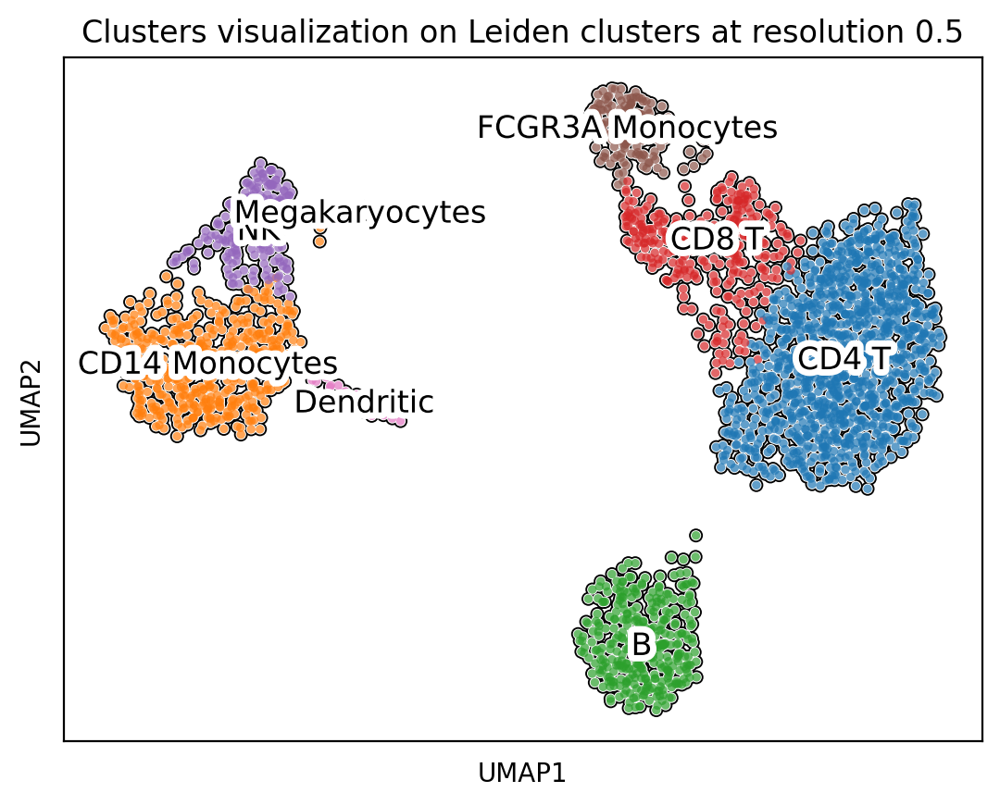

In [384]:
sc.pl.umap(adata, color=['leiden_0.5'], add_outline=True, 
           title='Clusters visualization on Leiden clusters at resolution 0.5',
           legend_loc='on data', #'right margin',
           legend_fontoutline=5, legend_fontweight= 'normal',
           legend_fontsize= 12, outline_width =(0.2, 0.1), frameon=True, save = '_leiden.png')

C:\Users\65861\anaconda3\lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


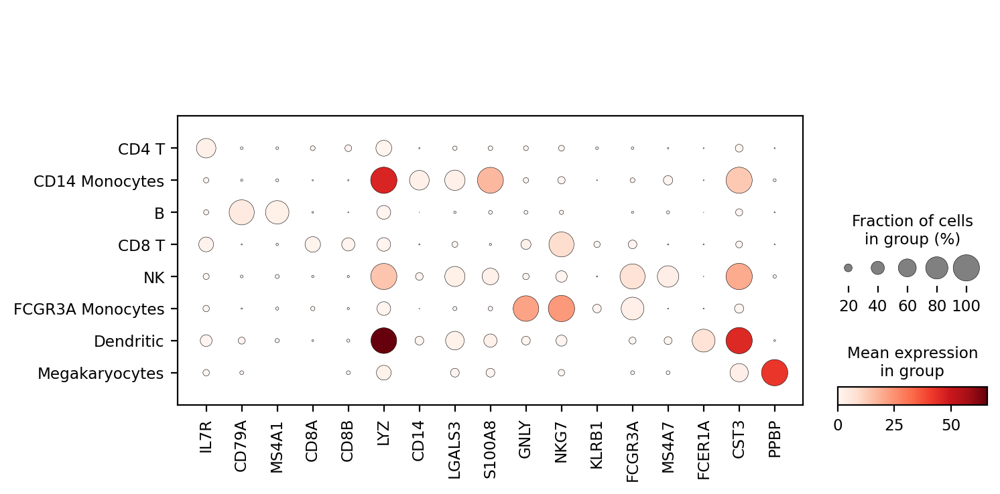

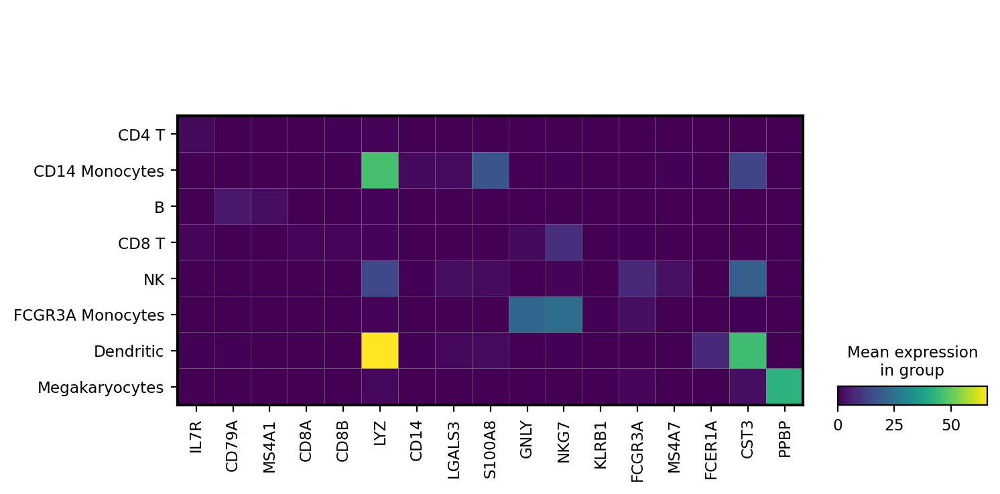

In [385]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden_0.5');
sc.pl.matrixplot(adata, marker_genes, groupby="leiden_0.5")

In summary, we learnt:

* Clustering using graph based clustering methods such as Leiden algorithm.
* Identifying differentially expressed genes/marker genes for each cluster
* Cluster annotation (Cell type annotation)
* Visualizations top DEGs and markers genes of interest


### Resources

https://www.sc-best-practices.org/preamble.html

https://scanpy.readthedocs.io/en/stable/

https://nbisweden.github.io/workshop-scRNAseq/labs/compiled/scanpy/scanpy_01_qc.html

https://www.10xgenomics.com/resources/datasets